# CSC 594 Final Project - Ghibli Style Generation

- Group 1: Sujay Pookkattuparambil, Daniyal Syed - Implementation from scratch
- Group 2: Amarsaikhan Batjargal, Talha Azaz -  Fine-tuning diffusion model

Custom created Dataset Link: https://www.kaggle.com/datasets/amarsaikhan/ghibli-illustration-dataset

## Group 1: Pix2PixHD Model Implementation from Scratch
Authors: 
- Sujay Pookkattuparambil (spookkat@depaul.edu)
- Daniyal Syed (dsyed1@depaul.edu)

## Group 2: Fine-tuning diffusion model
Authors:
- Amarsaikhan Batjargal (abatjarg@depaul.edu)
- Talha Azaz (tazaz@depaul.edu)

###  Introduction to major libraries

- **torch**: For deep learning operations and GPU acceleration.
- **torchvision**: For dataset preprocessing and image transformations.
- **PIL**: For image handling.
- **numpy**: Computing Library for matrices and its operations.
- **matplotlib**: For plotting curves
- **pandas**: For loading csv files as dataframe.
- **functools**: For higher-order functions
- **csv**: To write csv files

```
pip install torch torchvision numpy matplotlib pandas
```

## Checking images in Dataset

In [21]:
import os
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

#### When using colab

In [22]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

In [24]:
data_path = ""
if os.path.exists("/content/drive/MyDrive"):
    data_path = "/content/drive/MyDrive/"

In [25]:
data_path += r"Final_Ghibli_Dataset/ghibli-illustration-generated"
folder_name = "1000"

In [26]:
# function to read and display images
def diplay_dataset_image_pair(folder_path):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(Image.open(os.path.join(folder_path, "o.png")))
    ax[0].axis('off')
    ax[1].imshow(Image.open(os.path.join(folder_path, "g.png")))
    ax[1].axis('off')
    plt.tight_layout()
    plt.show()

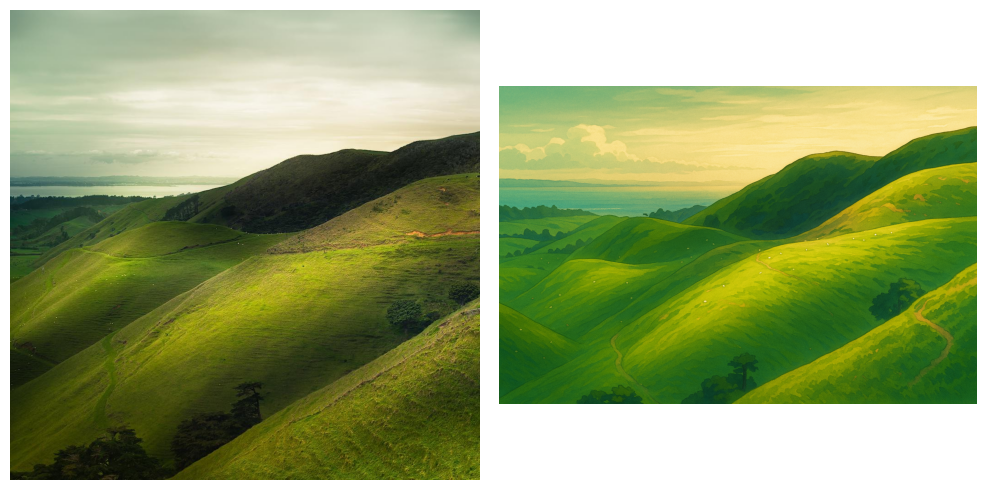

In [27]:
diplay_dataset_image_pair(os.path.join(data_path, folder_name))

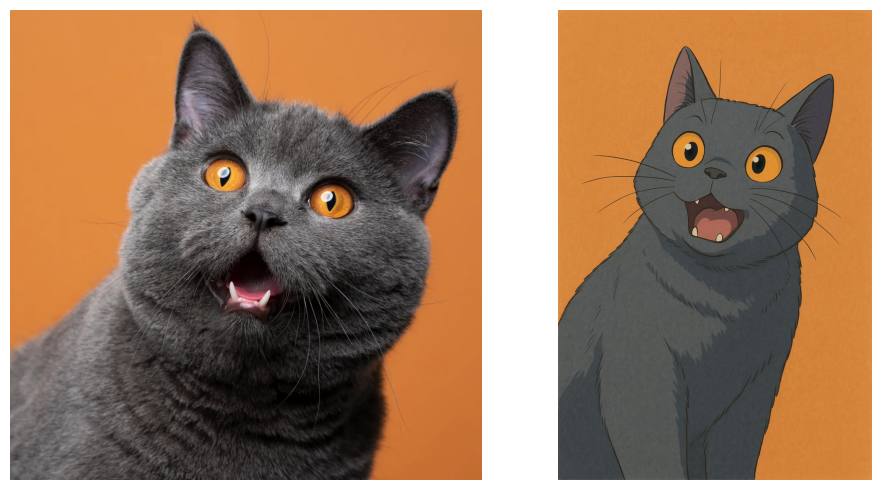

In [28]:
diplay_dataset_image_pair(os.path.join(data_path, "1100"))

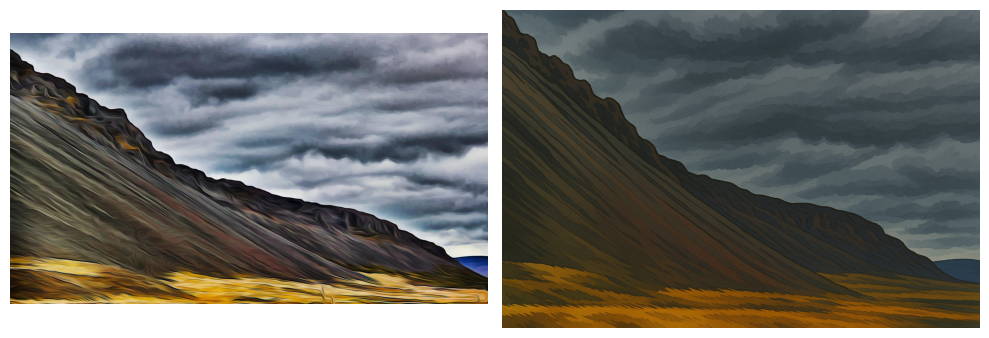

In [29]:
diplay_dataset_image_pair(os.path.join(data_path, "1200"))

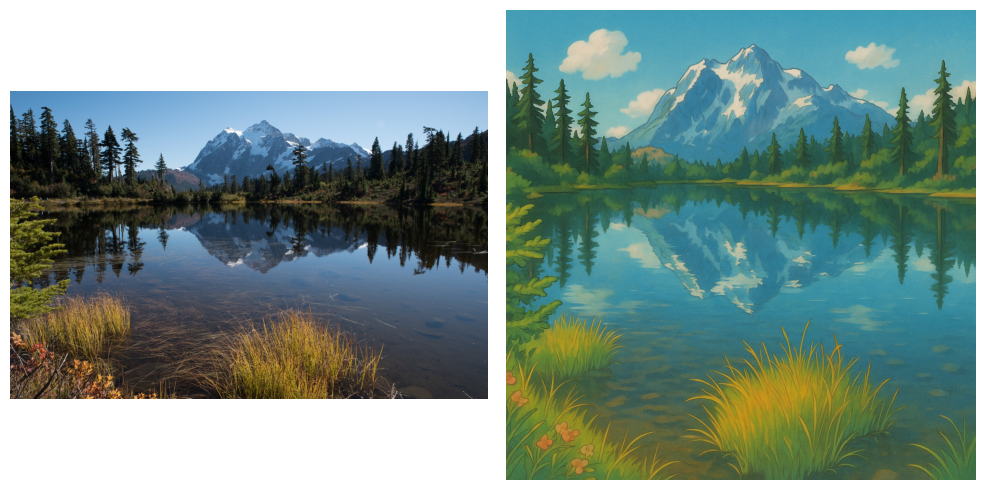

In [30]:
diplay_dataset_image_pair(os.path.join(data_path, "1300"))

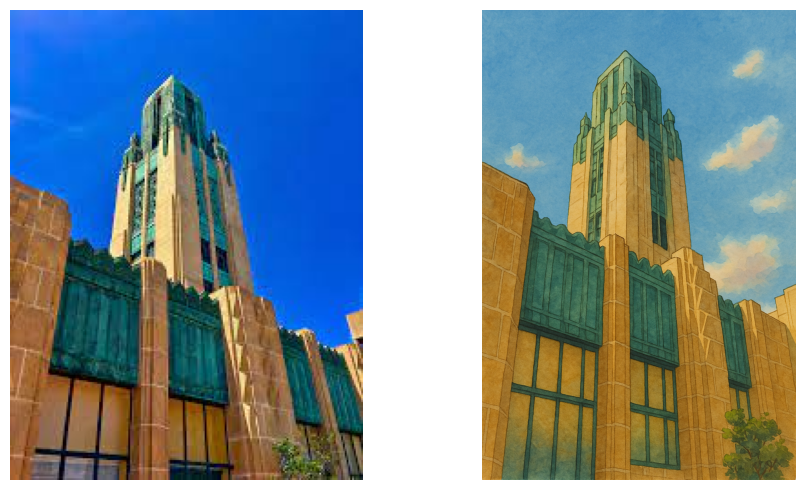

In [31]:
diplay_dataset_image_pair(os.path.join(data_path, "1399"))

## Creating Torch Dataset

In [32]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os

In [33]:
# Creates a custom torch dataset based on the folder paths provided
class GhibliDataset(Dataset):
    def __init__(self, data_path, image_size = (512, 512)):
        self._data_path = data_path
        self._folder_paths = os.listdir(data_path)
        self._transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor()
        ])

    def __apply_transform(self, img):
        return self._transform(img)

    def __len__(self):
        return len(self._folder_paths)

    def __getitem__(self, idx):
        folder_name = self._folder_paths[idx]
        og_image = self.__apply_transform(Image.open(os.path.join(self._data_path, folder_name, "o.png")).convert("RGB"))
        target_image = self.__apply_transform(Image.open(os.path.join(self._data_path, folder_name, "g.png")).convert("RGB"))

        return og_image, target_image

In [34]:
# Converts a torch Tensor to Numpy Array
def convertPTTensorToNP(img_tensor):
    return img_tensor.numpy()

In [35]:
# Since Matplotlib uses a different channel order, rearranging Torch Tensor to PLt order
def rearrangeTorchArrayForPlt(img_arr):
    return np.transpose(convertPTTensorToNP(img_arr), (1, 2, 0))

In [36]:
ghibli_data = GhibliDataset(data_path)

In [37]:
# First input-output pair in the dataset
ghibli_data.__getitem__(0)

(tensor([[[0.4784, 0.4824, 0.4863,  ..., 0.4902, 0.4863, 0.4824],
          [0.4784, 0.4824, 0.4863,  ..., 0.4902, 0.4902, 0.4863],
          [0.4784, 0.4824, 0.4863,  ..., 0.4941, 0.4902, 0.4902],
          ...,
          [0.0745, 0.0745, 0.0667,  ..., 0.4000, 0.4118, 0.4706],
          [0.0824, 0.0824, 0.0667,  ..., 0.4706, 0.4314, 0.4353],
          [0.0784, 0.0784, 0.0706,  ..., 0.4549, 0.4549, 0.4941]],
 
         [[0.5882, 0.5922, 0.5961,  ..., 0.5882, 0.5843, 0.5804],
          [0.5882, 0.5922, 0.5961,  ..., 0.5882, 0.5882, 0.5843],
          [0.5882, 0.5922, 0.5961,  ..., 0.5922, 0.5882, 0.5882],
          ...,
          [0.0941, 0.0902, 0.0824,  ..., 0.4510, 0.4627, 0.5216],
          [0.1020, 0.1020, 0.0824,  ..., 0.5216, 0.4824, 0.4863],
          [0.1020, 0.0980, 0.0863,  ..., 0.5059, 0.5059, 0.5451]],
 
         [[0.4980, 0.5020, 0.5059,  ..., 0.5020, 0.4980, 0.4941],
          [0.4980, 0.5020, 0.5059,  ..., 0.5020, 0.5020, 0.4980],
          [0.4980, 0.5020, 0.5059,  ...,

In [38]:
convertPTTensorToNP(ghibli_data.__getitem__(0)[0])

array([[[0.47843137, 0.48235294, 0.4862745 , ..., 0.49019608,
         0.4862745 , 0.48235294],
        [0.47843137, 0.48235294, 0.4862745 , ..., 0.49019608,
         0.49019608, 0.4862745 ],
        [0.47843137, 0.48235294, 0.4862745 , ..., 0.49411765,
         0.49019608, 0.49019608],
        ...,
        [0.07450981, 0.07450981, 0.06666667, ..., 0.4       ,
         0.4117647 , 0.47058824],
        [0.08235294, 0.08235294, 0.06666667, ..., 0.47058824,
         0.43137255, 0.43529412],
        [0.07843138, 0.07843138, 0.07058824, ..., 0.45490196,
         0.45490196, 0.49411765]],

       [[0.5882353 , 0.5921569 , 0.59607846, ..., 0.5882353 ,
         0.58431375, 0.5803922 ],
        [0.5882353 , 0.5921569 , 0.59607846, ..., 0.5882353 ,
         0.5882353 , 0.58431375],
        [0.5882353 , 0.5921569 , 0.59607846, ..., 0.5921569 ,
         0.5882353 , 0.5882353 ],
        ...,
        [0.09411765, 0.09019608, 0.08235294, ..., 0.4509804 ,
         0.4627451 , 0.52156866],
        [0.1

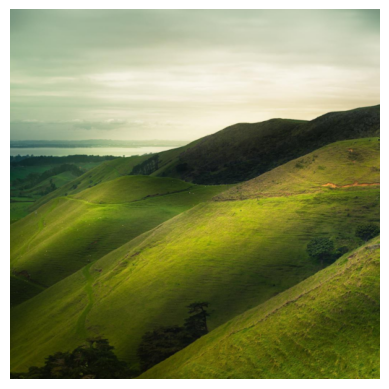

In [39]:
plt.imshow(rearrangeTorchArrayForPlt(ghibli_data.__getitem__(0)[0]))
plt.axis('off')
plt.show()

## Pix2PixHD Model Architecture

Original Paper: https://arxiv.org/pdf/1711.11585

Pix2PixHD extends the original Pix2Pix Architecture to generate higher quality and photo-realistic images.
Model takes in an input image and generates an output image.

It uses the following blocks:
- Multi-scale Generator
  - Uses the encoder-decoder structure and residual blocks.
  - This contains:
    - Global Generator: This generates the coarse and full-resolution output.
    - Local Enhancer: This refines the output by adding/enhancing finer details.
- Multi-scale Discriminator
  - Discriminates between the images.
  - Helps the model capture both global structure and finer details.
  - Uses discriminators at multiple scales.
  - Each discriminator is a PatchGAN.
- Loss Functions:
  - GAN Loss: For getting close to real image
  - VGG Loss: For capture high-level details.
  - L1 Loss: To maintain pix2pix similarity

### Import PyTorch and submodules. Define Helper functions.

In [40]:
#Import PyTorch and define helper functions for weight initialization (weights_init) and choosing normalization layers (get_norm_layer).

import torch
import torch.nn as nn
from torch.optim import Adam
from torchvision.utils import save_image
from torch.utils.data import random_split, DataLoader
import functools
from torch.autograd import Variable
import csv

In [41]:
# Iitializes the weights of the model
def weights_init(m):
    #print(type(m))
    classname = m.__class__.__name__
    #print(classname)
    #print(m)
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1 or classname.find('InstanceNorm2d') != -1:
        #print(m.weight)
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [42]:
# creates and returns specific normalization layers
def get_norm_layer(norm_type='instance'):
    if norm_type == 'batch':
        return functools.partial(nn.BatchNorm2d, affine=True)
    elif norm_type == 'instance':
        return functools.partial(nn.InstanceNorm2d, affine=True)
    else:
        raise ValueError(f"normalization layer {norm_type} is not found")

### Single residual block used throughout the generator.

In [43]:
#Define two-layer residual block with padding -> Conv3×3 -> Norm -> ReLU -> An optional dropout -> Conv3×3 -> Norm.

class ResnetBlock(nn.Module):
    def __init__(self, dim, padding_type, norm_layer, activation=nn.ReLU(True), use_dropout=False):
        super(ResnetBlock, self).__init__()
        self.conv_block = self.build_conv_block(dim, padding_type, norm_layer, activation, use_dropout)

    def build_conv_block(self, dim, padding_type, norm_layer, activation, use_dropout):
        conv_block = []
        p = 0
        if padding_type == 'reflect':
            conv_block += [nn.ReflectionPad2d(1)]
        elif padding_type == 'replicate':
            conv_block += [nn.ReplicationPad2d(1)]
        elif padding_type == 'zero':
            p = 1
        else:
            raise NotImplementedError(f'padding [{padding_type}] is not implemented')

        conv_block += [
            nn.Conv2d(dim, dim, kernel_size=3, padding=p),
            norm_layer(dim),
            activation
        ]
        if use_dropout:
            conv_block += [nn.Dropout(0.5)]

        if padding_type == 'reflect':
            conv_block += [nn.ReflectionPad2d(1)]
        elif padding_type == 'replicate':
            conv_block += [nn.ReplicationPad2d(1)]
        conv_block += [
            nn.Conv2d(dim, dim, kernel_size=3, padding=p),
            norm_layer(dim)
        ]

        return nn.Sequential(*conv_block)

    def forward(self, x):
        return x + self.conv_block(x)

In [47]:
res_net_test = ResnetBlock(3, padding_type='reflect', norm_layer=nn.BatchNorm2d, activation=nn.ReLU(True))
res_net_test

ResnetBlock(
  (conv_block): Sequential(
    (0): ReflectionPad2d((1, 1, 1, 1))
    (1): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1))
    (2): BatchNorm2d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU(inplace=True)
    (4): ReflectionPad2d((1, 1, 1, 1))
    (5): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1))
    (6): BatchNorm2d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)

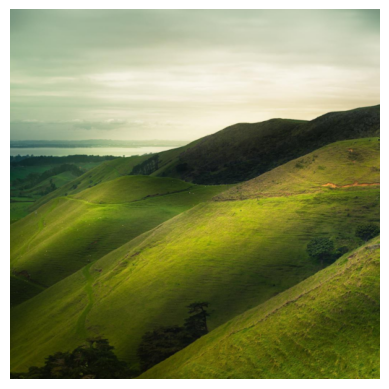

In [56]:
plt.imshow(rearrangeTorchArrayForPlt(ghibli_data.__getitem__(0)[0]))
plt.axis('off')
plt.show()

In [57]:
ghibli_data.__getitem__(0)[0].unsqueeze(dim=0).shape

torch.Size([1, 3, 512, 512])

In [61]:
out = res_net_test(ghibli_data.__getitem__(0)[0].unsqueeze(dim=0))
out.detach()

tensor([[[[ 0.8700,  0.7984,  0.7852,  ...,  0.8178,  0.8134,  0.7792],
          [ 0.8700,  0.7984,  0.7852,  ...,  0.8247,  0.8226,  0.9045],
          [ 0.8688,  0.7972,  0.8073,  ...,  0.8724,  0.8421,  0.8740],
          ...,
          [-1.9211, -2.0094, -2.1414,  ...,  1.0874,  1.0335,  1.1159],
          [-1.6299, -2.0749, -2.2120,  ...,  1.3118,  1.2725,  1.2765],
          [-1.7188, -2.1053, -2.1462,  ...,  1.2961,  1.2961,  1.3353]],

         [[-0.8017, -0.8984, -0.9206,  ..., -0.8016, -0.8414, -0.7894],
          [-0.8017, -0.8984, -0.9206,  ..., -0.9133, -0.8783, -0.8449],
          [-0.7936, -0.8903, -0.9118,  ..., -0.8210, -0.8343, -0.7942],
          ...,
          [ 1.9290,  1.6724,  1.5363,  ..., -0.1125, -0.1863, -0.0280],
          [ 1.9237,  1.5787,  1.6291,  ...,  0.1730,  0.1338,  0.1377],
          [ 2.0740,  1.4067,  1.2741,  ...,  0.1573,  0.1573,  0.1965]],

         [[ 0.3959,  0.3582,  0.4181,  ...,  0.4015,  0.3866,  0.3281],
          [ 0.3959,  0.3582,  

In [62]:
out.detach().shape

torch.Size([1, 3, 512, 512])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.728007..3.4332514].


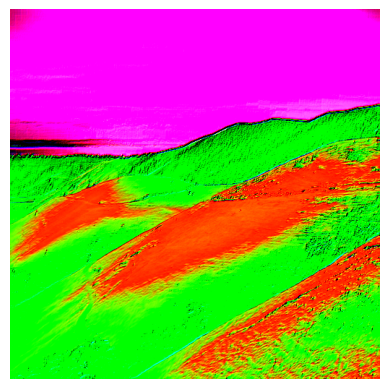

In [63]:
plt.imshow(rearrangeTorchArrayForPlt(out.detach().squeeze()))
plt.axis('off')
plt.show()

### Implement the coarse resolution backbone.

In [65]:
#Implement coarse global generator: 7×7 conv -> downsample (×N) -> N ResnetBlocks -> upsample (×N) -> 7×7 conv -> Tanh.

class GlobalGenerator(nn.Module):
    def __init__(
        self, input_nc, output_nc, ngf=64,
        n_downsampling=3, n_blocks=9,
        norm_layer=nn.BatchNorm2d, padding_type='reflect'
    ):
        super(GlobalGenerator, self).__init__()
        assert n_blocks >= 0, "n_blocks must be non-negative"
        activation = nn.ReLU(True)

        model = []
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0),
            norm_layer(ngf),
            activation
        ]

        for i in range(n_downsampling):
            mult = 2 ** i
            model += [
                nn.Conv2d(ngf * mult, ngf * mult * 2, kernel_size=3, stride=2, padding=1),
                norm_layer(ngf * mult * 2),
                activation
            ]

        mult = 2 ** n_downsampling
        for _ in range(n_blocks):
            model += [
                ResnetBlock(ngf * mult, padding_type=padding_type, norm_layer=norm_layer, activation=activation)
            ]

        for i in range(n_downsampling):
            mult = 2 ** (n_downsampling - i)
            model += [
                nn.ConvTranspose2d(ngf * mult, int(ngf * mult / 2),
                                   kernel_size=3, stride=2, padding=1, output_padding=1),
                norm_layer(int(ngf * mult / 2)),
                activation
            ]

        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(ngf, output_nc, kernel_size=7, padding=0),
            nn.Tanh()
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

In [68]:
global_gen_test = GlobalGenerator(3, 3, 32, 3, 9, get_norm_layer(norm_type='instance'))
global_gen_test

GlobalGenerator(
  (model): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1))
    (2): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (3): ReLU(inplace=True)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (6): ReLU(inplace=True)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (11): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (12): ReLU(inplace=True)
    (13): ResnetBlock(
      (conv_block): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(256, 256, kernel_size=(3, 3)

In [69]:
out = global_gen_test(ghibli_data.__getitem__(0)[0].unsqueeze(dim=0))
out.detach()

tensor([[[[-0.1063,  0.1223,  0.1486,  ..., -0.0787, -0.1160, -0.0749],
          [ 0.5023,  0.2088, -0.0229,  ..., -0.1139,  0.0670,  0.1929],
          [ 0.3210,  0.0538,  0.2588,  ..., -0.1416, -0.0781, -0.1733],
          ...,
          [ 0.0253, -0.2997,  0.1117,  ...,  0.1623,  0.0015, -0.0906],
          [-0.0740, -0.0080, -0.1651,  ...,  0.2342,  0.0204,  0.0799],
          [-0.0815, -0.0706, -0.2023,  ..., -0.2618,  0.1350, -0.0616]],

         [[-0.6027, -0.2047, -0.6040,  ...,  0.3877, -0.2426, -0.2453],
          [-0.2807, -0.2855, -0.1500,  ...,  0.1282,  0.1587, -0.0694],
          [-0.4796, -0.4140, -0.6590,  ...,  0.1229,  0.2554, -0.2383],
          ...,
          [-0.2790, -0.5515, -0.0915,  ..., -0.2456, -0.0797, -0.0329],
          [-0.2516,  0.2181, -0.2019,  ...,  0.2913, -0.4625,  0.1105],
          [-0.3224,  0.0491, -0.0399,  ...,  0.1001, -0.2960, -0.0726]],

         [[-0.0622,  0.4152, -0.7789,  ...,  0.2340, -0.0791,  0.2082],
          [-0.2834, -0.4302, -

In [70]:
out.detach().shape

torch.Size([1, 3, 512, 512])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9991817..0.98493266].


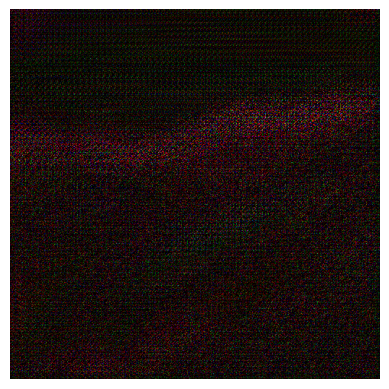

In [71]:
plt.imshow(rearrangeTorchArrayForPlt(out.detach().squeeze()))
plt.axis('off')
plt.show()

### Define LocalEnhancer to refine GlobalGenerator's coarse output at higher resolution.

In [73]:
#Build on the global generator’s output by stripping its last layers and adding one or more local down-up-sampling ResNet stages for high-res refinement.

class LocalEnhancer(nn.Module):
    def __init__(
        self, input_nc, output_nc, ngf=32,
        n_downsample_global=3, n_blocks_global=9,
        n_local_enhancers=1, n_blocks_local=3,
        norm_layer=nn.BatchNorm2d, padding_type='reflect'
    ):
        super(LocalEnhancer, self).__init__()
        self.n_local_enhancers = n_local_enhancers

        ngf_global = ngf * (2 ** n_local_enhancers)
        global_net = GlobalGenerator(
            input_nc, output_nc, ngf_global,
            n_downsample_global, n_blocks_global, norm_layer
        ).model
        stripped_global = [global_net[i] for i in range(len(global_net) - 3)]
        self.model = nn.Sequential(*stripped_global)

        for n in range(1, n_local_enhancers + 1):
            ngf_local = ngf * (2 ** (n_local_enhancers - n))

            model_downsample = [
                nn.ReflectionPad2d(3),
                nn.Conv2d(input_nc, ngf_local, kernel_size=7, padding=0),
                norm_layer(ngf_local),
                nn.ReLU(True),
                nn.Conv2d(ngf_local, ngf_local * 2, kernel_size=3, stride=2, padding=1),
                norm_layer(ngf_local * 2),
                nn.ReLU(True)
            ]

            model_upsample = []
            for _ in range(n_blocks_local):
                model_upsample += [
                    ResnetBlock(ngf_local * 2, padding_type=padding_type, norm_layer=norm_layer, activation=nn.ReLU(True))
                ]

            model_upsample += [
                nn.ConvTranspose2d(ngf_local * 2, ngf_local,
                                   kernel_size=3, stride=2, padding=1, output_padding=1),
                norm_layer(ngf_local),
                nn.ReLU(True)
            ]

            if n == n_local_enhancers:
                model_upsample += [
                    nn.ReflectionPad2d(3),
                    nn.Conv2d(ngf, output_nc, kernel_size=7, padding=0),
                    nn.Tanh()
                ]

            setattr(self, f'model{n}_1', nn.Sequential(*model_downsample))
            setattr(self, f'model{n}_2', nn.Sequential(*model_upsample))

        self.downsample = nn.AvgPool2d(3, stride=2, padding=[1, 1], count_include_pad=False)

    def forward(self, input):
        input_downsampled = [input]
        for _ in range(self.n_local_enhancers):
            input_downsampled.append(self.downsample(input_downsampled[-1]))
        output_prev = self.model(input_downsampled[-1])
        for n in range(1, self.n_local_enhancers + 1):
            model_down = getattr(self, f'model{n}_1')
            model_up   = getattr(self, f'model{n}_2')
            input_i = input_downsampled[self.n_local_enhancers - n]
            output_prev = model_up(model_down(input_i) + output_prev)
        return output_prev

In [75]:
local_enhance_test = LocalEnhancer(3, 3, 32, 3, 9, 1, 3, get_norm_layer(norm_type='instance'))
local_enhance_test

LocalEnhancer(
  (model): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
    (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (3): ReLU(inplace=True)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (11): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (12): ReLU(inplace=True)
    (13): ResnetBlock(
      (conv_block): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(512, 512, kernel_size=(3, 3

In [76]:
out = local_enhance_test(ghibli_data.__getitem__(0)[0].unsqueeze(dim=0))
out.detach()

tensor([[[[ 0.5802,  0.4020,  0.5318,  ...,  0.5555,  0.3596,  0.1590],
          [ 0.1521,  0.3356,  0.1755,  ...,  0.2946,  0.1216,  0.3023],
          [ 0.3558,  0.2691,  0.4870,  ...,  0.3797,  0.1997, -0.0242],
          ...,
          [-0.1443,  0.2342, -0.3595,  ...,  0.1808,  0.1793,  0.0302],
          [ 0.3597,  0.0201,  0.4677,  ...,  0.1496,  0.4245,  0.1898],
          [-0.0016,  0.1277,  0.0077,  ...,  0.2263,  0.1729,  0.3263]],

         [[ 0.1204, -0.6350, -0.1689,  ..., -0.1134, -0.1094, -0.4262],
          [ 0.6254, -0.2505,  0.5141,  ..., -0.2239,  0.4545, -0.1361],
          [ 0.1289, -0.2048,  0.1298,  ...,  0.1233, -0.1662,  0.2673],
          ...,
          [ 0.4183, -0.1770,  0.0164,  ..., -0.1328,  0.3310, -0.0849],
          [ 0.3590, -0.0324,  0.4657,  ..., -0.1564, -0.0860, -0.0995],
          [ 0.2325, -0.0439, -0.1026,  ..., -0.1240,  0.1620,  0.1586]],

         [[ 0.4123, -0.5003,  0.1516,  ..., -0.1614,  0.3516,  0.0130],
          [-0.1618,  0.3429, -

In [77]:
out.detach().shape

torch.Size([1, 3, 512, 512])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9887288..0.9984153].


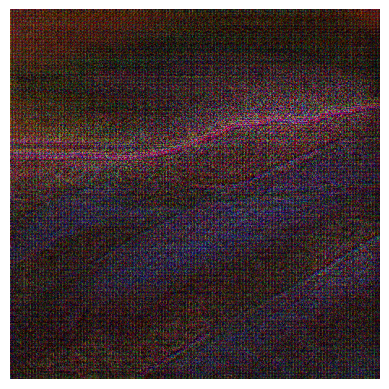

In [78]:
plt.imshow(rearrangeTorchArrayForPlt(out.detach().squeeze()))
plt.axis('off')
plt.show()

### Implement Encoder module.

In [80]:
#Downsampling feature extractor: 7×7 conv -> norm -> ReLU -> repeated strided conv blocks -> final 7×7 conv.

class Encoder(nn.Module):
    def __init__(self, input_nc, output_nc, ngf, n_downsampling=3, norm_layer=nn.BatchNorm2d):
        super(Encoder, self).__init__()
        activation = nn.ReLU(True)
        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0),
            norm_layer(ngf),
            activation
        ]
        for i in range(n_downsampling):
            mult = 2 ** i
            model += [
                nn.Conv2d(ngf * mult, ngf * mult * 2, kernel_size=3, stride=2, padding=1),
                norm_layer(ngf * mult * 2),
                activation
            ]
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(ngf * (2 ** n_downsampling), output_nc, kernel_size=7, padding=0)
        ]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

In [81]:
encoder_test = Encoder(3, 3, 32, n_downsampling=3, norm_layer=nn.BatchNorm2d)
encoder_test

Encoder(
  (model): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1))
    (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU(inplace=True)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (11): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): ReflectionPad2d((3, 3, 3, 3))
    (14): Conv2d(256, 3, kernel_size=(7, 7), stride=(1, 1))
  )
)

In [82]:
out = encoder_test(ghibli_data.__getitem__(0)[0].unsqueeze(dim=0))
out.detach()

tensor([[[[-0.2598, -0.2573, -0.1647,  ...,  0.0822,  0.0604,  0.1194],
          [-0.3725, -0.2638, -0.1012,  ..., -0.0308,  0.0143, -0.0674],
          [-0.3552, -0.2853,  0.0330,  ...,  0.1735,  0.1343,  0.1005],
          ...,
          [-0.0403, -0.0135, -0.3779,  ...,  0.2580, -0.1357,  0.2955],
          [ 0.2294, -0.0190, -0.2167,  ...,  0.2635, -0.2445, -0.3989],
          [ 0.0548,  0.4069,  0.0164,  ...,  0.3728,  0.0488, -0.2894]],

         [[ 0.0400,  0.0393, -0.1399,  ...,  0.2358,  0.1525,  0.0368],
          [ 0.3136,  0.1351,  0.0706,  ...,  0.1079,  0.1268,  0.1553],
          [ 0.0083, -0.0906, -0.1165,  ..., -0.1623, -0.2112, -0.2990],
          ...,
          [-0.1996, -0.3960, -0.5637,  ..., -0.2296,  0.2476, -0.3176],
          [-0.5600, -0.6237, -0.8845,  ...,  0.3511, -0.0227, -0.3916],
          [-0.2294, -0.0993, -0.8172,  ..., -0.2860, -0.2572, -0.3256]],

         [[ 0.0824,  0.2469,  0.1339,  ...,  0.2598,  0.2476,  0.2222],
          [ 0.0485,  0.1226, -

In [83]:
out.detach().shape

torch.Size([1, 3, 64, 64])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9697123..1.4764801].


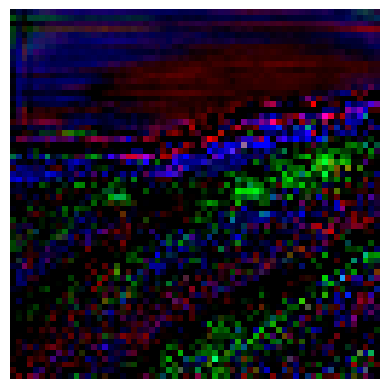

In [84]:
plt.imshow(rearrangeTorchArrayForPlt(out.detach().squeeze()))
plt.axis('off')
plt.show()

### Define PatchGAN discriminators

In [86]:
#Define single-scale PatchGAN (NLayerDiscriminator) and wrap multiple scales into MultiscaleDiscriminator, each judging real/fake at decreasing resolutions.

class NLayerDiscriminator(nn.Module):
    def __init__(self, input_nc, ndf=64, n_layers=3,
                 norm_layer=nn.BatchNorm2d, use_sigmoid=False, getIntermFeat=False):
        super(NLayerDiscriminator, self).__init__()
        self.getIntermFeat = getIntermFeat
        activation = nn.LeakyReLU(0.2, True)
        kw = 4
        padw = 1

        sequence = [nn.Conv2d(input_nc, ndf, kernel_size=kw, stride=2, padding=padw),
                    activation]
        nf = ndf

        for n in range(1, n_layers):
            nf_prev = nf
            nf = min(nf_prev * 2, 512)
            sequence += [
                nn.Conv2d(nf_prev, nf, kernel_size=kw, stride=2, padding=padw),
                norm_layer(nf),
                activation
            ]

        nf_prev = nf
        nf = min(nf_prev * 2, 512)
        sequence += [
            nn.Conv2d(nf_prev, nf, kernel_size=kw, stride=1, padding=padw),
            norm_layer(nf),
            activation
        ]

        sequence += [nn.Conv2d(nf, 1, kernel_size=kw, stride=1, padding=padw)]
        if use_sigmoid:
            sequence += [nn.Sigmoid()]

        if getIntermFeat:
            self.model = nn.ModuleList([nn.Sequential(layer) for layer in sequence])
        else:
            self.model = nn.Sequential(*sequence)

    def forward(self, x):
        if self.getIntermFeat:
            res = [x]
            for m in self.model:
                res.append(m(res[-1]))
            return res[1:]
        else:
            return [self.model(x)]

In [88]:
n_discriminator_test = NLayerDiscriminator(3, 32, 3, norm_layer=nn.BatchNorm2d, use_sigmoid=False, getIntermFeat=False)
n_discriminator_test

NLayerDiscriminator(
  (model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)

In [92]:
out = n_discriminator_test(ghibli_data.__getitem__(0)[0].unsqueeze(dim=0))
out[0].detach()

tensor([[[[-0.6212, -0.1203,  0.1200,  ...,  0.0449, -0.2631,  0.0617],
          [ 0.0781, -0.0454,  0.4613,  ..., -0.2129, -0.3605, -0.6386],
          [-0.3464, -0.1629,  0.3159,  ...,  0.1325, -0.0666, -0.1392],
          ...,
          [-0.0563,  0.1921,  0.0609,  ...,  0.1938, -0.1412,  0.1120],
          [-0.3123, -0.1331, -0.3432,  ...,  0.4017, -0.1981, -0.4038],
          [-0.2205, -0.3547, -0.0555,  ...,  0.2098,  0.0984, -0.0888]]]])

In [93]:
out[0].detach().shape

torch.Size([1, 1, 62, 62])

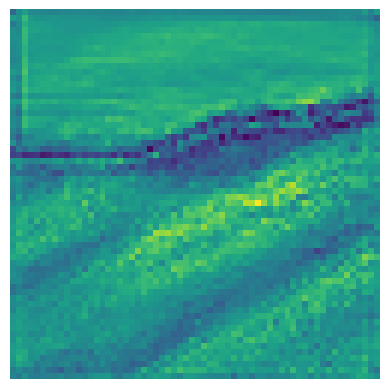

In [95]:
plt.imshow(rearrangeTorchArrayForPlt(out[0].detach().squeeze(dim=0)))
plt.axis('off')
plt.show()

In [97]:
class MultiscaleDiscriminator(nn.Module):
    def __init__(self, input_nc, ndf=64, n_layers=3,
                 norm_layer=nn.BatchNorm2d, use_sigmoid=False,
                 num_D=1, getIntermFeat=False):
        super(MultiscaleDiscriminator, self).__init__()
        self.num_D = num_D
        self.getIntermFeat = getIntermFeat

        for i in range(num_D):
            netD = NLayerDiscriminator(input_nc, ndf, n_layers, norm_layer, use_sigmoid, getIntermFeat)
            setattr(self, f'd{i}', netD)

        self.downsample = nn.AvgPool2d(3, stride=2, padding=[1, 1], count_include_pad=False)

    def singleD_forward(self, model, x):
        if self.getIntermFeat:
            result = []
            input = x
            for m in model:
                result.append(m(input))
                input = m(input)
            return result
        else:
            return model(x)

    def forward(self, input):
        results = []
        input_downsampled = input
        for i in range(self.num_D):
            model = getattr(self, f'd{i}')
            if self.getIntermFeat:
                results.append(self.singleD_forward(model.model, input_downsampled))
            else:
                results.append(self.singleD_forward(model.model, input_downsampled))
            input_downsampled = self.downsample(input_downsampled)
        return results

In [98]:
mscale_discriminator_test = MultiscaleDiscriminator(3, ndf=32, n_layers=3, norm_layer=nn.BatchNorm2d, use_sigmoid=False, num_D=1, getIntermFeat=False)
mscale_discriminator_test

MultiscaleDiscriminator(
  (d0): NLayerDiscriminator(
    (model): Sequential(
      (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
      (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    )
  )
  (downsample): AvgPool2d(k

In [99]:
out = mscale_discriminator_test(ghibli_data.__getitem__(0)[0].unsqueeze(dim=0))
out[0].detach()

tensor([[[[-3.7187e-01,  1.9510e-01,  3.1062e-01,  ...,  3.4306e-01,
            2.2740e-01, -1.2769e-01],
          [-1.6615e-01,  3.6214e-01,  4.5355e-03,  ..., -3.9501e-01,
           -2.4796e-01, -3.9913e-01],
          [-8.7560e-02,  5.6214e-01,  1.0179e-01,  ...,  6.3831e-03,
            2.4157e-01, -2.7808e-01],
          ...,
          [ 5.2183e-01,  9.1807e-02,  1.1938e-01,  ...,  4.6916e-01,
            1.1693e-02, -2.4180e-01],
          [ 2.4804e-01,  1.9507e-01,  3.3661e-01,  ...,  7.7453e-01,
            4.4416e-01, -5.3200e-01],
          [ 4.4080e-02,  4.9293e-05,  1.9502e-01,  ..., -6.6117e-02,
            1.0490e-01, -2.0801e-01]]]])

In [100]:
out[0].detach().shape

torch.Size([1, 1, 62, 62])

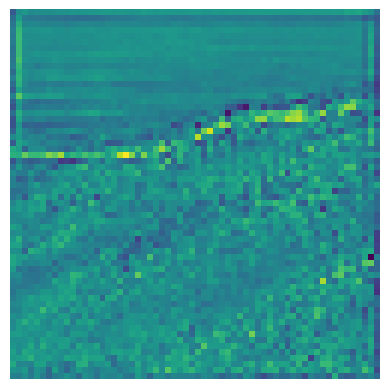

In [101]:
plt.imshow(rearrangeTorchArrayForPlt(out[0].detach().squeeze(dim=0)))
plt.axis('off')
plt.show()

### Factory functions for generator and discriminator instances. Implement loss-wrapper classes for GAN and perceptual losses.

In [102]:
#Provide helper functions (define_G/define_D) to instantiate G/D with proper init.

def define_G(
    input_nc, output_nc, ngf, netG,
    n_downsample_global=3, n_blocks_global=9,
    n_local_enhancers=1, n_blocks_local=3,
    norm='instance', gpu_ids=[]
):
    norm_layer = get_norm_layer(norm_type=norm)
    if netG == 'global':
        model = GlobalGenerator(input_nc, output_nc, ngf,
                                n_downsample_global, n_blocks_global, norm_layer)
    elif netG == 'local':
        model = LocalEnhancer(input_nc, output_nc, ngf,
                              n_downsample_global, n_blocks_global,
                              n_local_enhancers, n_blocks_local, norm_layer)
        #print("Model: ", model)
    elif netG == 'encoder':
        model = Encoder(input_nc, output_nc, ngf, n_downsample_global, norm_layer)
    else:
        raise ValueError('generator not implemented!')
    if gpu_ids:
        model.cuda(gpu_ids[0])
    model.apply(weights_init)
    return model

In [103]:
G_test = define_G(3, 3, ngf=32, netG="local", n_local_enhancers=1, gpu_ids=[])
G_test

LocalEnhancer(
  (model): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
    (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (3): ReLU(inplace=True)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (11): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (12): ReLU(inplace=True)
    (13): ResnetBlock(
      (conv_block): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(512, 512, kernel_size=(3, 3

In [106]:
out = G_test(ghibli_data.__getitem__(0)[0].unsqueeze(dim=0))
out.detach()

tensor([[[[-0.1868,  0.1908,  0.1008,  ...,  0.3551,  0.3314,  0.3054],
          [ 0.5353, -0.3560,  0.5698,  ...,  0.2350,  0.1872, -0.4069],
          [-0.0444, -0.3065,  0.4333,  ...,  0.3724,  0.0145,  0.2847],
          ...,
          [ 0.5933,  0.6641,  0.3624,  ...,  0.2305,  0.4795,  0.4173],
          [-0.1455, -0.1028, -0.3925,  ..., -0.0704,  0.4568,  0.4029],
          [ 0.5927,  0.7811,  0.5211,  ...,  0.2468,  0.3056,  0.2898]],

         [[ 0.1689,  0.3784,  0.1590,  ..., -0.0216,  0.2937,  0.1005],
          [-0.2986, -0.4724,  0.4751,  ...,  0.2958,  0.3075,  0.2072],
          [ 0.1268, -0.1594,  0.2122,  ..., -0.0797,  0.2563, -0.2689],
          ...,
          [-0.3518, -0.4149,  0.0995,  ...,  0.4118,  0.4803, -0.0265],
          [ 0.1620,  0.0449, -0.2770,  ...,  0.3189,  0.1002,  0.2451],
          [-0.3048,  0.1045, -0.1732,  ...,  0.5013, -0.2674,  0.4133]],

         [[-0.2389, -0.2741,  0.0170,  ..., -0.1499,  0.4936, -0.3529],
          [ 0.2702, -0.0540, -

In [107]:
out.detach().shape

torch.Size([1, 3, 512, 512])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999141..0.99964577].


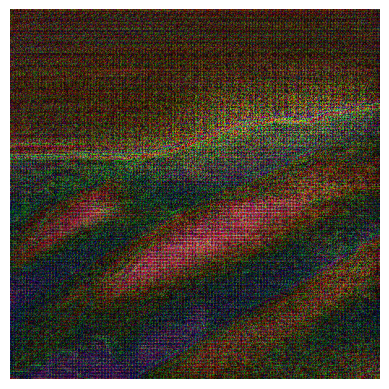

In [108]:
plt.imshow(rearrangeTorchArrayForPlt(out.detach().squeeze(dim=0)))
plt.axis('off')
plt.show()

In [109]:
def define_D(
    input_nc, ndf, n_layers_D,
    norm='instance', use_sigmoid=False,
    num_D=1, getIntermFeat=False, gpu_ids=[]
):
    norm_layer = get_norm_layer(norm_type=norm)
    model = MultiscaleDiscriminator(
        input_nc, ndf, n_layers_D, norm_layer,
        use_sigmoid, num_D, getIntermFeat
    )
    if gpu_ids:
        model.cuda(gpu_ids[0])
    model.apply(weights_init)
    return model

In [112]:
D_test = define_D(3, ndf=64, n_layers_D=3, num_D=1, gpu_ids=[])
D_test

MultiscaleDiscriminator(
  (d0): NLayerDiscriminator(
    (model): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
      (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    )
  )
  (downsampl

In [115]:
out = D_test(ghibli_data.__getitem__(0)[0].unsqueeze(dim=0))
out[0].shape

torch.Size([1, 1, 62, 62])

In [116]:
out[0].detach().shape

torch.Size([1, 1, 62, 62])

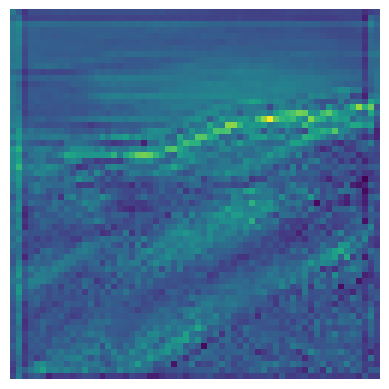

In [117]:
plt.imshow(rearrangeTorchArrayForPlt(out[0].detach().squeeze(dim=0)))
plt.axis('off')
plt.show()

In [119]:
#Implement GANLoss (LSGAN wrapper) and VGGLoss (perceptual loss) classes.

class GANLoss(nn.Module):
    def __init__(
        self, use_lsgan=True,
        target_real_label=1.0, target_fake_label=0.0,
        tensor=torch.FloatTensor
    ):
        super(GANLoss, self).__init__()
        self.real_label = target_real_label
        self.fake_label = target_fake_label
        self.real_label_var = None
        self.fake_label_var = None
        self.Tensor = tensor
        self.loss = nn.MSELoss() if use_lsgan else nn.BCELoss()

    def get_target_tensor(self, input, target_is_real):
        if target_is_real:
            if self.real_label_var is None or self.real_label_var.numel() != input.numel():
                real_tensor = self.Tensor(input.size()).fill_(self.real_label)
                self.real_label_var = Variable(real_tensor, requires_grad=False).to(input.device) # Move to input device
            return self.real_label_var.to(input.device) # Ensure it's on input device
        else:
            if self.fake_label_var is None or self.fake_label_var.numel() != input.numel():
                fake_tensor = self.Tensor(input.size()).fill_(self.fake_label)
                self.fake_label_var = Variable(fake_tensor, requires_grad=False).to(input.device) # Move to input device
            return self.fake_label_var.to(input.device) # Ensure it's on input device

    def __call__(self, input, target_is_real):
        if isinstance(input[0], list):
            loss = 0
            for pred in input:
                pred = pred[-1]
                target_tensor = self.get_target_tensor(pred, target_is_real)
                loss += self.loss(pred, target_tensor)
            return loss
        else:
            target_tensor = self.get_target_tensor(input[-1], target_is_real)
            return self.loss(input[-1], target_tensor)

In [ ]:
class VGGLoss(nn.Module):
    def __init__(self, gpu_ids):
        super(VGGLoss, self).__init__()
        from torchvision import models
        vgg_model = models.vgg19(pretrained=True).features
        self.vgg = vgg_model
        if gpu_ids:
          self.vgg = vgg_model.cuda()
        self.criterion = nn.L1Loss()
        self.weights = [1.0/32, 1.0/16, 1.0/8, 1.0/4, 1.0]

    def forward(self, x, y):
        x_vgg = self.vgg(x)
        y_vgg = self.vgg(y)
        loss = 0
        for i in range(len(x_vgg)):
            loss += self.weights[i] * self.criterion(x_vgg[i], y_vgg[i].detach())
        return loss

## Train

In [ ]:
# creating a Trainer class to load models, data along with helper functions to train model
class Trainer:
    def __init__(self, G, D, train_loader, val_loader, num_epochs=50, start_epoch=1, lr=2e-4, device="cuda", checkpoint_dir="checkpoints/"):
        os.makedirs(checkpoint_dir, exist_ok=True)
        self.num_epochs = num_epochs
        self.start_epoch = start_epoch
        self.device = device
        self.lr = lr
        self.G = G
        self.D = D
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.criterionGAN = GANLoss(use_lsgan=True, tensor=torch.FloatTensor).to(device)
        self.criterionL1 = nn.L1Loss().to(device)
        if device.type == "cuda":
          self.criterionVGG = VGGLoss(gpu_ids=[device]).to(device)
        else:
          self.criterionVGG = VGGLoss(gpu_ids=[])
        self.opt_G = Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
        self.opt_D = Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))

        self.checkpoint_dir = checkpoint_dir
        self.f = open(f"{checkpoint_dir}/losses.csv", "a")
        self.csv_writer = csv.writer(self.f)
        pass

    def save_checkpoint(self, state, path):
        # saves checkpoints of model
        torch.save(state, path)

    def load_checkpoint(self, path):
        # loads specific checkpoint of model
        ckpt = torch.load(path, map_location='cpu')
        self.G.load_state_dict(ckpt['G_state'])
        self.D.load_state_dict(ckpt['D_state'])
        self.opt_G.load_state_dict(ckpt['opt_G'])
        self.opt_D.load_state_dict(ckpt['opt_D'])
        return ckpt['epoch'] + 1

    def validate(self, epoch, out_dir):
        # validates model  against validation set printing losses, and writing first batch of images to file.
        self.G.eval()
        os.makedirs(out_dir, exist_ok=True)
        total_val_G_loss = 0
        total_val_D_loss = 0
        with torch.no_grad():
            for idx, (real, ghibli) in enumerate(self.val_loader):
                #real, ghibli = next(iter(self.val_loader))
                real, ghibli = real.to(self.device), ghibli.to(self.device)
                fake = self.G(real)
                grid = torch.cat([real, ghibli, fake], dim=0)
                D_input_real = torch.cat([real, ghibli], dim=1)
                D_input_fake = torch.cat([real, fake], dim=1)
                loss_D = self.criterionGAN(self.D(D_input_real), True) + self.criterionGAN(self.D(D_input_fake), False)
                D_input_fake = torch.cat([real, fake], dim=1)
                loss_G = self.criterionGAN(self.D(D_input_fake), True) \
                        + 10.0 * self.criterionL1(fake, ghibli) \
                        + 5.0 * self.criterionVGG(fake, ghibli)
                total_val_G_loss += loss_G.item()
                total_val_D_loss += loss_D.item()

                if idx == 0:
                    save_image((grid * 0.5 + 0.5), os.path.join(out_dir, f"val_epoch_{epoch}.png"), nrow=real.size(0))
                    print(f"    Validation image saved for epoch {epoch}")
        print(f"    Validation G_Loss: {total_val_G_loss/len(self.val_loader)} D_Loss: {total_val_D_loss/len(self.val_loader)}")

    def train(self):
        # Entire training loop
        print("Starting Training")
        try:
          for epoch in range(start_epoch, self.num_epochs + 1):
              self.G.train(); self.D.train()
              epoch_G_loss = 0
              epoch_D_loss = 0
              img_cntr = 0
              print(f"  Epoch {epoch}")
              for real, ghibli in self.train_loader:
                  real, ghibli = real.to(self.device), ghibli.to(self.device)

                  # Train Discriminator
                  fake = self.G(real)
                  D_input_real = torch.cat([real, ghibli], dim=1)
                  D_input_fake = torch.cat([real, fake], dim=1)
                  #print(D_input_real)
                  #print(D_input_fake)
                  loss_D = self.criterionGAN(self.D(D_input_real), True) + self.criterionGAN(self.D(D_input_fake), False)
                  self.opt_D.zero_grad()
                  loss_D.backward(retain_graph=True)
                  self.opt_D.step()

                  # Train Generator
                  D_input_fake = torch.cat([real, fake], dim=1)
                  loss_G = self.criterionGAN(self.D(D_input_fake), True) \
                        + 10.0 * self.criterionL1(fake, ghibli) \
                        + 5.0 * self.criterionVGG(fake, ghibli)
                  self.opt_G.zero_grad()
                  loss_G.backward()
                  self.opt_G.step()

                  epoch_G_loss += loss_G.item()
                  epoch_D_loss += loss_D.item()

                  real.detach()
                  ghibli.detach()
                  fake.detach()

                  print(f"    Image {img_cntr}, G_loss: {loss_G.item():.4f} D_loss: {loss_D.item():.4f}")
                  img_cntr += 1

              print(f"  [Epoch {epoch}/{self.num_epochs}] G_loss: {epoch_G_loss/len(train_loader):.4f} "
                    f"D_loss: {epoch_D_loss/len(train_loader):.4f}")
              self.csv_writer.writerow([epoch, epoch_G_loss/len(train_loader), epoch_D_loss/len(train_loader)])

              self.save_checkpoint({
                  'epoch': epoch,
                  'G_state': G.state_dict(),
                  'D_state': D.state_dict(),
                  'opt_G': self.opt_G.state_dict(),
                  'opt_D': self.opt_D.state_dict()
              }, os.path.join(self.checkpoint_dir, f"ckpt_epoch_{epoch}.pth"))

              if epoch % 1 == 0:
                self.validate(epoch, self.checkpoint_dir)

        except KeyboardInterrupt:
            print("Training Interrupted")

        self.f.close()

#### Fixing parameters and starting training

In [ ]:
data_path = ""
root_path = ""
if os.path.exists("/content/drive/MyDrive"):
    root_path = "/content/drive/MyDrive/"
    data_path = "/content/drive/MyDrive/"

data_path += r"Final_Ghibli_Dataset/ghibli-illustration-generated"

train_root = data_path
val_root = "data/val"
test_root = "data/test"

# Data loaders
train_ds = GhibliDataset(train_root)
#val_ds = GhibliDataset(val_root)
#test_ds = GhibliDataset(test_root)

total_size = len(train_ds)
train_size = int(0.8 * total_size)
val_size = int(0.1 * total_size)
test_size = total_size - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(
    train_ds, [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(42)
)

print(f"Train size: {len(train_dataset)}")
print(f"Val size: {len(val_dataset)}")
print(f"Test size: {len(test_dataset)}")

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)

# Models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == "cuda":
  G = define_G(3, 3, ngf=32, netG="local", n_local_enhancers=1, gpu_ids=[device])
  D = define_D(6, ndf=64, n_layers_D=3, num_D=1, gpu_ids=[device])
else:
  G = define_G(3, 3, ngf=32, netG="local", n_local_enhancers=1)
  D = define_D(6, ndf=64, n_layers_D=3, num_D=1)

# Optional: Resume from checkpoint
start_epoch = 1
latest_ckpt = f"{root_path}/checkpoints/ckpt_epoch_20.pth"

trainer = Trainer(G, D, train_loader, val_loader, num_epochs=1000, start_epoch=start_epoch, device=device, checkpoint_dir=f"{root_path}/checkpoints/")

if os.path.isfile(latest_ckpt):
    start_epoch = trainer.load_checkpoint(latest_ckpt)

# Train
trainer.train()

Train size: 320
Val size: 40
Test size: 40


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 81.9MB/s]


Starting Training
  Epoch 21
    Image 0, G_loss: 1.9077 D_loss: 0.4657
    Image 1, G_loss: 2.0288 D_loss: 0.4494
    Image 2, G_loss: 2.3446 D_loss: 0.4678
    Image 3, G_loss: 1.9588 D_loss: 0.4675
    Image 4, G_loss: 2.4409 D_loss: 0.4867
    Image 5, G_loss: 1.9118 D_loss: 0.5240
    Image 6, G_loss: 2.1310 D_loss: 0.4425
    Image 7, G_loss: 1.8467 D_loss: 0.4395
    Image 8, G_loss: 1.7412 D_loss: 0.3634
    Image 9, G_loss: 1.6946 D_loss: 0.4054
    Image 10, G_loss: 2.1343 D_loss: 0.4192
    Image 11, G_loss: 2.4495 D_loss: 0.3929
    Image 12, G_loss: 2.0549 D_loss: 0.4934
    Image 13, G_loss: 2.0971 D_loss: 0.4899
    Image 14, G_loss: 2.0315 D_loss: 0.5328
    Image 15, G_loss: 2.1827 D_loss: 0.4509
    Image 16, G_loss: 2.2700 D_loss: 0.4837
    Image 17, G_loss: 1.7728 D_loss: 0.5640
    Image 18, G_loss: 2.1021 D_loss: 0.4893
    Image 19, G_loss: 2.0140 D_loss: 0.4134
    Image 20, G_loss: 2.0660 D_loss: 0.4864
    Image 21, G_loss: 2.0713 D_loss: 0.5499
    Image 22,

#### Plotting curves

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
losses = pd.read_csv("checkpoints/losses.csv", header=None)[:-1]
losses

,0,1,2
0,1,3.117556,1.510229
1,2,2.131138,0.594476
2,3,2.094204,0.578784
3,4,2.047938,0.559200
4,5,2.017163,0.526910
5,11,2.019893,0.512827


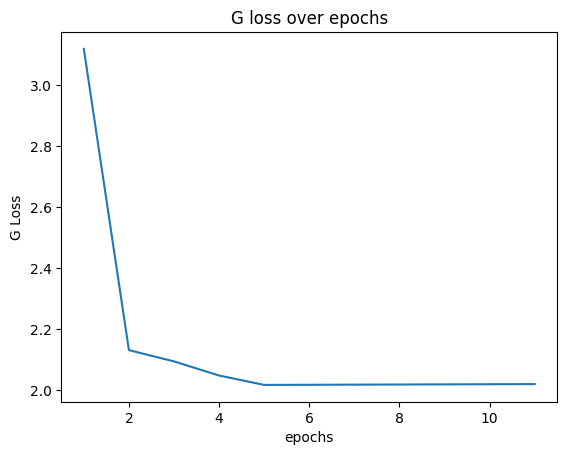

In [4]:
plt.plot(losses[0], losses[1])
plt.title('G loss over epochs')
plt.xlabel('epochs')
plt.ylabel('G Loss')
plt.savefig('GLoss.png')
plt.show()

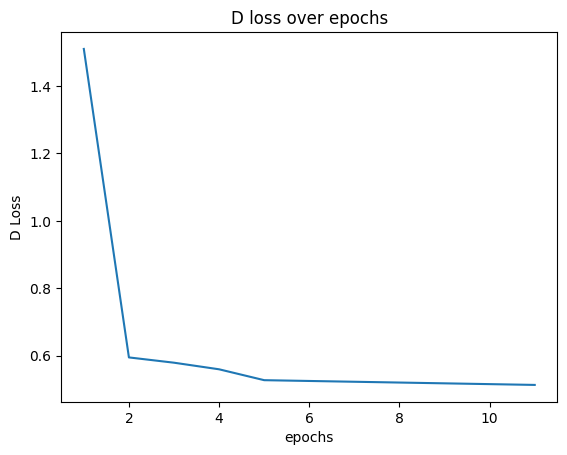

In [5]:
plt.plot(losses[0], losses[2])
plt.title('D loss over epochs')
plt.xlabel('epochs')
plt.ylabel('D Loss')
plt.savefig('DLoss.png')
plt.show()

In [24]:
def load_checkpoint(G, D, path):
        ckpt = torch.load(path, map_location='cpu')
        G.load_state_dict(ckpt['G_state'])
        D.load_state_dict(ckpt['D_state'])
        return G, D

In [28]:
def test(G, D, test_loader, out_dir, device):
    G.eval()
    os.makedirs(out_dir, exist_ok=True)
    criterionGAN = GANLoss(use_lsgan=True, tensor=torch.FloatTensor).to(device)
    criterionL1 = nn.L1Loss().to(device)
    if device.type == "cuda":
        criterionVGG = VGGLoss(gpu_ids=[device]).to(device)
    else:
        criterionVGG = VGGLoss(gpu_ids=[])
    total_test_G_loss = 0
    total_test_D_loss = 0
    with torch.no_grad():
        for idx, (real, ghibli) in enumerate(test_loader):
            #real, ghibli = next(iter(self.val_loader))
            real, ghibli = real.to(device), ghibli.to(device)
            fake = G(real)
            grid = torch.cat([real, ghibli, fake], dim=0)
            D_input_real = torch.cat([real, ghibli], dim=1)
            D_input_fake = torch.cat([real, fake], dim=1)
            loss_D = criterionGAN(D(D_input_real), True) + criterionGAN(D(D_input_fake), False)
            D_input_fake = torch.cat([real, fake], dim=1)
            loss_G = criterionGAN(D(D_input_fake), True) \
                    + 10.0 * criterionL1(fake, ghibli) \
                    + 5.0 * criterionVGG(fake, ghibli)
            total_test_G_loss += loss_G.item()
            total_test_D_loss += loss_D.item()

            #if idx == 0:
            save_image((grid * 0.5 + 0.5), os.path.join(out_dir, f"test_batch_{idx}.png"), nrow=real.size(0))
            print(f"    Test image saved for batch {idx}")
    print(f"    Test G_Loss: {total_test_G_loss/len(test_loader)} D_Loss: {total_test_D_loss/len(test_loader)}")

In [29]:
data_path = ""
root_path = ""
if os.path.exists("/content/drive/MyDrive"):
    root_path = "/content/drive/MyDrive/"
    data_path = "/content/drive/MyDrive/"

out_dir = f"{root_path}/test_results"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == "cuda":
  G = define_G(3, 3, ngf=32, netG="local", n_local_enhancers=1, gpu_ids=[device])
  D = define_D(6, ndf=64, n_layers_D=3, num_D=1, gpu_ids=[device])
else:
  G = define_G(3, 3, ngf=32, netG="local", n_local_enhancers=1)
  D = define_D(6, ndf=64, n_layers_D=3, num_D=1)

latest_ckpt = f"{root_path}/checkpoints/ckpt_epoch_110.pth"

G, D = load_checkpoint(G, D, latest_ckpt)
test(G, D, test_loader, out_dir, device)

    Test image saved for batch 0
    Test image saved for batch 1
    Test image saved for batch 2
    Test image saved for batch 3
    Test image saved for batch 4
    Test image saved for batch 5
    Test image saved for batch 6
    Test image saved for batch 7
    Test image saved for batch 8
    Test image saved for batch 9
    Test G_Loss: 2.010274577140808 D_Loss: 0.3888657748699188


Validation Gif Link: https://drive.google.com/file/d/1TuMb73zu3PSkeh4TtlN6UtarnSI7UmRT/view?usp=sharing

## Group 2: Fine-tuning diffusion model
##  Introduction to Libraries

This project leverages PyTorch and Hugging Face's `diffusers` library to train a LoRA-enhanced image-to-image transformer model. The key libraries used are:

- **torch**: For deep learning operations and GPU acceleration.
- **diffusers**: For pre-trained diffusion models like Stable Diffusion.
- **accelerate**: For efficient training with mixed precision and multi-GPU support.
- **torchvision**: For dataset preprocessing and image transformations.
- **PIL**: For image handling.
- **tqdm**: For progress visualization.


```bash
pip install diffusers==0.25.0 accelerate==0.30.1 torchvision
``` 

```
pip install scikit-image lpips
```

In [1]:
# =============================
# #### Library Imports and Setup
# =============================
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from tqdm import tqdm

# Import Hugging Face diffusers and accelerate libraries for model loading and training optimization
from accelerate import Accelerator
from diffusers import StableDiffusionImg2ImgPipeline, DDIMScheduler, UNet2DConditionModel
from diffusers.models.attention_processor import LoRAAttnProcessor2_0, AttnProcessor, LoRAAttnProcessor

In [ ]:
# =============================
# Dataset and DataLoader Setup
# =============================

class GhibliDataset(Dataset):
    """
    GhibliDataset is a custom PyTorch Dataset for loading images from specified directories.
    It expects each directory to contain pairs of images: one original (o.png) and one generated (g.png).
    The images are transformed using a series of augmentations and normalization before being returned.
    """
    def __init__(self, root_dirs):
        self.data = []
        # Allow single or multiple root directories
        if isinstance(root_dirs, str):
            root_dirs = [root_dirs]
        
        # Define image transformations including normalization and data augmentation
        self.transform = transforms.Compose([
            transforms.Resize((512, 512)),
            transforms.RandomHorizontalFlip(),
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])

        # Load image paths from each folder
        for root_dir in root_dirs:
            for folder in sorted(os.listdir(root_dir)):
                path = os.path.join(root_dir, folder)
                o_path = os.path.join(path, "o.png")
                g_path = os.path.join(path, "g.png")
                if os.path.exists(o_path) and os.path.exists(g_path):
                    self.data.append((o_path, g_path))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # Load original and stylized images, apply transforms, return as tensor pair
        o_img = Image.open(self.data[idx][0]).convert("RGB")
        g_img = Image.open(self.data[idx][1]).convert("RGB")
        return self.transform(o_img), self.transform(g_img)



---

### **2. Model Design and Implementation**

**Markdown Cell:**
```markdown
## 2. Model Design and Implementation

We fine-tune a pretrained Stable Diffusion model using LoRA layers to guide image transformation in "Ghibli illustration" style. The model accepts an input image and a prompt and outputs a stylized image.

We inject **LoRA layers** into attention modules of the U-Net backbone to reduce training complexity and memory usage.


In [3]:
# =============================
# Accelerator Setup
# =============================
accelerator = Accelerator(mixed_precision="bf16") # Use bf16 for better performance on supported hardware
device = accelerator.device

In [ ]:
# =============================
# Model Setup
# =============================


# Load the pretrained Stable Diffusion pipeline
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.bfloat16,  # or torch.float16
    safety_checker=None
)
pipe.enable_attention_slicing()
pipe.enable_model_cpu_offload()

# Extract components for training
vae = pipe.vae
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder.to(device)
scheduler = DDIMScheduler.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="scheduler")

# Load the U-Net and move to training device
unet = UNet2DConditionModel.from_pretrained(
    "runwayml/stable-diffusion-v1-5", subfolder="unet", torch_dtype=torch.bfloat16
).to(device)


# Replace attention processors in U-Net with LoRA processors
lora_attn_processors = {}
for name, module in unet.attn_processors.items():
    if isinstance(module, AttnProcessor):  # Only replace supported ones
        # Replace standard attention with LoRA version
        lora_attn_processors[name] = LoRAAttnProcessor2_0(base_processor=module)
    else:
        # Keep non-attention layers unchanged
        lora_attn_processors[name] = module  # keep original if not LoRA-compatible

# Sanity check: ensure all processors are replaced
if len(lora_attn_processors) != len(unet.attn_processors):
    raise ValueError(f"Expected {len(unet.attn_processors)} processors, got {len(lora_attn_processors)}")

# Apply LoRA processors to U-Net
unet.set_attn_processor(lora_attn_processors)

# Set model to training mode
unet.train()

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
                (to_k): Linear(in_features=320, out_features=320, bias=False)
                (to_v): Linear(in_features=320, out_fe

In [5]:
from torch.utils.data import random_split

# Load the full dataset
full_dataset = GhibliDataset("ghibli-illustration-generated")

# Define split sizes (e.g., 80% train, 20% val)
val_ratio = 0.2
val_size = int(len(full_dataset) * val_ratio)
train_size = len(full_dataset) - val_size

# Split the dataset
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])

# Dataloaders
train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)


In [6]:
# =============================
# Training Setup
# =============================

# Use AdamW optimizer for weight decay regularization
optimizer = torch.optim.AdamW(unet.parameters(), lr=5e-6)#1e-6)

# Prepare components using accelerator
unet, optimizer, dataloader = accelerator.prepare(unet, optimizer, train_loader)
vae.to(dtype=torch.bfloat16, device=device)

AutoencoderKL(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
        )
        (downsamplers): ModuleList(
          (0): Downsample2D(
            (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
          )
        )
      )
      (1): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (c

In [7]:
# Ensure only LoRA parameters are updated during training
for name, module in unet.named_modules():
    if isinstance(module, LoRAAttnProcessor2_0):
        for param in module.parameters():
            print(f"Setting requires_grad for {name}.{param.name} to True")
            param.requires_grad = True

In [8]:
for name, param in unet.named_parameters():
    if param.requires_grad:
        print(name)


conv_in.weight
conv_in.bias
time_embedding.linear_1.weight
time_embedding.linear_1.bias
time_embedding.linear_2.weight
time_embedding.linear_2.bias
down_blocks.0.attentions.0.norm.weight
down_blocks.0.attentions.0.norm.bias
down_blocks.0.attentions.0.proj_in.weight
down_blocks.0.attentions.0.proj_in.bias
down_blocks.0.attentions.0.transformer_blocks.0.norm1.weight
down_blocks.0.attentions.0.transformer_blocks.0.norm1.bias
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q.weight
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k.weight
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v.weight
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.0.weight
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.0.bias
down_blocks.0.attentions.0.transformer_blocks.0.norm2.weight
down_blocks.0.attentions.0.transformer_blocks.0.norm2.bias
down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_q.weight
down_blocks.0.attentions.0.transformer_blocks.0.attn

## 3. Training Process

We train only LoRA parameters while keeping other parts of the network frozen. The training objective is to predict the added noise in latent space, using MSE loss.

Training involves:
- Encoding target image into latents
- Adding noise with timestep `t`
- Predicting the noise from the noised latent
- Computing loss and backpropagating only through LoRA layers

We use mixed-precision (`bfloat16`) for memory efficiency.


In [9]:
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
import lpips

# LPIPS metric (must install via: pip install lpips)
lpips_fn = lpips.LPIPS(net='alex').to(device)

# Store values for plotting
train_losses = []
ssim_scores = []
lpips_scores = []


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/home/abatjarg/anaconda3/envs/ghibli/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/abatjarg/anaconda3/envs/ghibli/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/abatjarg/anaconda3/envs/ghibli/lib/python3.11/site-packages/lpips/weights/v0.1/alex.pth


In [ ]:
num_epochs = 10 # 10

for epoch in range(num_epochs):
    epoch_loss = 0.0
    for step, (o_img, g_img) in enumerate(tqdm(train_loader)):
        try:
            # Move input/output to device
            g_img = g_img.to(device, dtype=torch.bfloat16)
            o_img = o_img.to(device, dtype=torch.bfloat16)

            # Generate text embeddings from prompt
            prompt = ["ghibli illustration"]
            input_ids = tokenizer(prompt, return_tensors="pt", padding=True).input_ids.to(device)
            with torch.no_grad():
                text_embeddings = text_encoder(input_ids)[0]
                text_embeddings = text_embeddings.repeat(g_img.size(0), 1, 1)

            # Encode target image to latent space
            with torch.no_grad():
                latents = vae.encode(g_img.to(device, dtype=torch.bfloat16)).latent_dist.sample()
                latents = latents * 0.18215
                latents = torch.clamp(latents, -1.0, 1.0)

            # Add noise for denoising training objective
            noise = torch.randn_like(latents)
            t = torch.randint(0, scheduler.config.num_train_timesteps, (1,), device=device).long()
            noisy_latents = scheduler.add_noise(latents, noise, t)

            # Predict noise using U-Net
            output = unet(noisy_latents, t, encoder_hidden_states=text_embeddings)
            noise_pred = output.sample

            # Compute loss between predicted and actual noise
            loss = torch.nn.functional.mse_loss(noise_pred.float(), noise.float(), reduction="mean") + 1e-6

            # Skip invalid loss values
            if not torch.isfinite(loss):
                print(f"Step {step}: Skipped due to NaN loss ({loss.item()})")
                continue
            
            # Backpropagation and optimization
            optimizer.zero_grad()
            accelerator.backward(loss)
            torch.nn.utils.clip_grad_norm_(unet.parameters(), max_norm=0.5)
            optimizer.step()

            epoch_loss += loss.item()

        except RuntimeError as e:
            if "out of memory" in str(e):
                print(f"OOM at step {step}. Skipping batch.")
                torch.cuda.empty_cache()
                continue
            else:
                raise e
    avg_loss = epoch_loss / len(dataloader)
    train_losses.append(avg_loss)
    
    

    print(f"Epoch {epoch+1}/{num_epochs} - Loss: {avg_loss:.4f}")


pipe.unet = unet

100%|██████████| 32/32 [01:22<00:00,  2.59s/it]


Epoch 1/10 - Loss: 0.1533


100%|██████████| 32/32 [01:21<00:00,  2.55s/it]


Epoch 2/10 - Loss: 0.1048


100%|██████████| 32/32 [01:21<00:00,  2.54s/it]


Epoch 3/10 - Loss: 0.1342


100%|██████████| 32/32 [01:20<00:00,  2.53s/it]


Epoch 4/10 - Loss: 0.1034


100%|██████████| 32/32 [01:20<00:00,  2.52s/it]


Epoch 5/10 - Loss: 0.1246


100%|██████████| 32/32 [01:20<00:00,  2.50s/it]


Epoch 6/10 - Loss: 0.1231


100%|██████████| 32/32 [01:21<00:00,  2.54s/it]


Epoch 7/10 - Loss: 0.0963


100%|██████████| 32/32 [01:20<00:00,  2.51s/it]


Epoch 8/10 - Loss: 0.1040


100%|██████████| 32/32 [01:20<00:00,  2.50s/it]


Epoch 9/10 - Loss: 0.1025


100%|██████████| 32/32 [01:20<00:00,  2.52s/it]

Epoch 10/10 - Loss: 0.0796


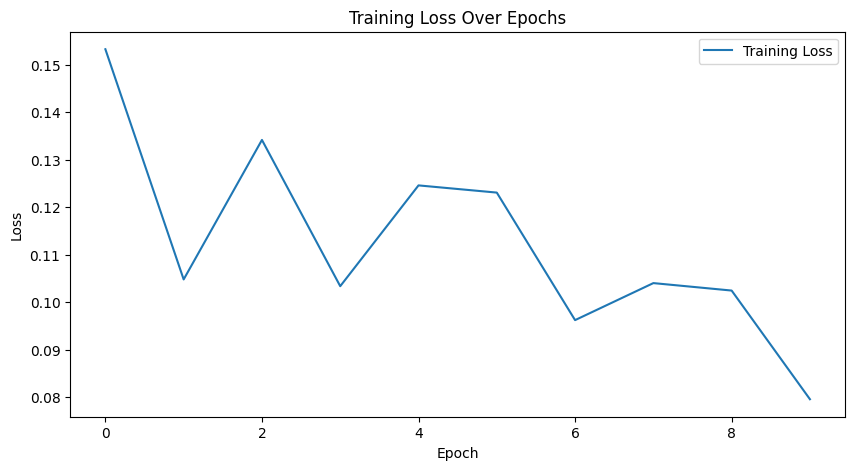

In [11]:
# plot training loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.show()

## Evaluation Metrics: SSIM and LPIPS

To evaluate the similarity between the generated image and the ground truth, we use two complementary metrics:

### SSIM (Structural Similarity Index)
- Measures structural similarity between two images.
- Considers luminance, contrast, and structure.
- Returns a value between -1 and 1 (1 = perfect match).
- Implemented via `skimage.metrics.structural_similarity`.

### LPIPS (Learned Perceptual Image Patch Similarity)
- A perceptual similarity metric that uses deep neural network features (e.g., AlexNet or VGG).
- Captures high-level differences better than pixel-wise metrics like MSE.
- Lower LPIPS values indicate better visual similarity.
- Implemented via the `lpips` library: `pip install lpips`.

These metrics help quantify the visual quality of style-transferred (Ghibli) images relative to the target.


In [13]:
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
import lpips

def evaluate_on_validation(pipe, val_dataset, lpips_fn, device):
    ssim_scores = []
    lpips_scores = []

    for idx in range(len(val_dataset)):
        input_img, gt_img = val_dataset[idx]  # both are tensors from Dataset

        # Convert input tensor to PIL for the pipeline
        input_pil = transforms.ToPILImage()(input_img.cpu()).convert("RGB")

        with torch.autocast("cuda", dtype=torch.bfloat16):
            pred = pipe(
                prompt="ghibli illustration",
                image=input_pil,
                strength=0.4,
                guidance_scale=6.0
            ).images[0]

        # Convert both GT and prediction to tensors
        gt_tensor = gt_img.unsqueeze(0).to(device)  # already tensor from dataset
        pred_tensor = transforms.ToTensor()(pred).unsqueeze(0).to(device)  # pred is PIL

        # Resize if shapes mismatch
        if pred_tensor.shape[-1] != gt_tensor.shape[-1]:
            pred_tensor = torch.nn.functional.interpolate(pred_tensor, size=gt_tensor.shape[-2:], mode='bilinear')

        # Compute SSIM
        ssim_score = ssim(
            gt_tensor.squeeze().permute(1, 2, 0).cpu().numpy(),
            pred_tensor.squeeze().permute(1, 2, 0).cpu().numpy(),
            channel_axis=2,
            data_range=1.0
        )
        ssim_scores.append(ssim_score)

        # Compute LPIPS
        lp = lpips_fn(gt_tensor, pred_tensor)
        lpips_scores.append(lp.item())

    avg_ssim = sum(ssim_scores) / len(ssim_scores)
    avg_lpips = sum(lpips_scores) / len(lpips_scores)

    return avg_ssim, avg_lpips


ssim_val, lpips_val = evaluate_on_validation(pipe, val_dataset, lpips_fn, device)
print(f"Epoch {epoch+1}: SSIM = {ssim_val:.4f}, LPIPS = {lpips_val:.4f}")



  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10: SSIM = -0.0088, LPIPS = 0.7353


In [14]:
# =============================
# Save Fine-Tuned LoRA Weights
# =============================

# Save trained LoRA weights only if main process
if accelerator.is_main_process:
    try:
        unet.save_attn_procs("ghibli_lora_finetune")
        print("LoRA weights saved successfully")
    except Exception as e:
        print(f"\n[ERROR] Could not save LoRA weights: {e}")


[ERROR] Could not save LoRA weights: 'UNet2DConditionModel' object has no attribute 'peft_config'


In [15]:
# Load and preprocess test image
sample_path = "ghibli-illustration-generated/1000/o.png"
image = Image.open(sample_path).convert("RGB").resize((512, 512))

# Generate image using fine-tuned pipeline
with torch.autocast("cuda", dtype=torch.bfloat16):
    output = pipe(prompt="ghibli illustration", image=image, strength=0.6, guidance_scale=7.5)

# Plot the generated image
output_image = output.images[0]
output_image.save("ghibli_generated_image.png")

  0%|          | 0/30 [00:00<?, ?it/s]

## 4. Evaluation on the image

Below, we test the trained model on validation samples by comparing:
- Input image
- Ground truth (target Ghibli-styled image)
- Model prediction

This visual comparison demonstrates the learned transformation ability of our LoRA-enhanced model.


In [16]:
unet

UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
                (to_k): Linear(in_features=320, out_features=320, bias=False)
                (to_v): Linear(in_features=320, out_fe

In [21]:
sample_path = "ghibli-illustration-generated/1000/o.png"  # <- Update this to an actual image path
image = Image.open(sample_path).convert("RGB").resize((512, 512))
image_tensor = transforms.ToTensor()(image).unsqueeze(0).to(device, dtype=torch.bfloat16)

# Prompt for conditioning
prompt = "ghibli illustration"

# Generate image
with torch.autocast("cuda", dtype=torch.bfloat16):
    output = pipe(prompt=prompt, image=image, strength=0.6, guidance_scale=7.5)

output_image = output.images[0]
output_image.save("output_ghibli_gen.png")
print("Prediction saved as output_ghibli.png")

  0%|          | 0/30 [00:00<?, ?it/s]

Prediction saved as output_ghibli.png


  0%|          | 0/20 [00:00<?, ?it/s]

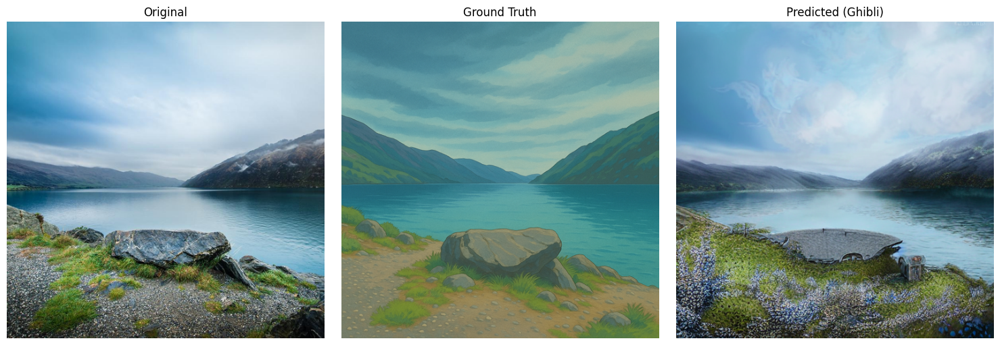

In [18]:
import matplotlib.pyplot as plt
# =============================
# Compare original input, ground truth, and generated output
val_rooth_dir = "ghibli-illustration-generated/1010" #15
val_img_path = val_rooth_dir +"/o.png"  # Update this path
input_image = Image.open(val_img_path).convert("RGB").resize((512, 512))

# Generate image
with torch.autocast("cuda", dtype=torch.bfloat16):
    #output = pipe(prompt="ghibli style", image=input_image, strength=0.75, guidance_scale=7.5)
    #output = pipe(prompt="ghibli illustration", image=input_image, strength=0.5, guidance_scale=4.0)
    output = pipe(prompt="ghibli illustration", image=input_image, strength=0.4, guidance_scale=6.0)


# Show or save result
output_image = output.images[0]
output_image.save("output_ghibli_from_memory.png")

# Optional: Show 3-panel image comparison
gt_path = val_rooth_dir+"/g.png"  # Update with ground truth
gt_image = Image.open(gt_path).convert("RGB").resize((512, 512))

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(input_image)
axs[0].set_title("Original")
axs[1].imshow(gt_image)
axs[1].set_title("Ground Truth")
axs[2].imshow(output_image)
axs[2].set_title("Predicted (Ghibli)")
for ax in axs: ax.axis("off")
plt.tight_layout()
plt.show()

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

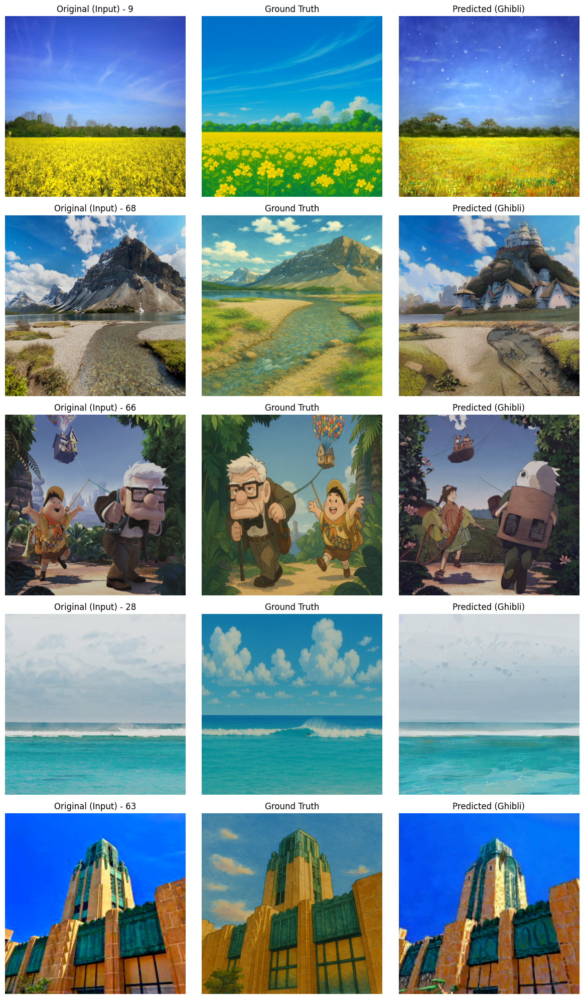

In [25]:
def unnormalize(tensor):
    """Reverse [-1, 1] normalization back to [0, 1] for visualization."""
    return tensor * 0.5 + 0.5

def visualize_random_predictions(pipe, val_dataset, device, num_samples=5):
    import matplotlib.pyplot as plt
    import random
    from torchvision.transforms.functional import to_pil_image

    indices = random.sample(range(len(val_dataset)), num_samples)

    fig, axs = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))

    for i, idx in enumerate(indices):
        # Get input and GT, unnormalize to view properly
        input_tensor, gt_tensor = val_dataset[idx]
        input_img = unnormalize(input_tensor).clamp(0, 1)
        gt_img = unnormalize(gt_tensor).clamp(0, 1)

        input_pil = to_pil_image(input_img)
        gt_pil = to_pil_image(gt_img)

        # Inference
        with torch.autocast("cuda", dtype=torch.bfloat16):
            output = pipe(prompt="ghibli illustration", image=input_pil, strength=0.45, guidance_scale=6.0)
        pred_pil = output.images[0]

        # Plot the images
        axs[i, 0].imshow(input_pil)
        axs[i, 0].set_title(f"Original (Input) - {idx}")

        axs[i, 1].imshow(gt_pil)
        axs[i, 1].set_title("Ground Truth")

        axs[i, 2].imshow(pred_pil)
        axs[i, 2].set_title("Predicted (Ghibli)")

        for j in range(3):
            axs[i, j].axis("off")

    plt.tight_layout()
    plt.show()

visualize_random_predictions(pipe, val_dataset, device, num_samples=5)